In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


from sklearn.linear_model import ElasticNet, SGDRegressor, LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, normalize


import statsmodels as sm
import statsmodels.formula.api as smf
import statsmodels.api as sma

import pandas_profiling


import warnings
import copy
warnings.filterwarnings("ignore")

%matplotlib inline

In [3]:
df = pd.read_csv('all_nta.csv')

In [4]:
df.head()

,ntacode,Boiler Emissions- Total NOx Emissions:Per km2,Boiler Emissions- Total PM2.5 Emissions:Per km2,Boiler Emissions- Total SO2 Emissions:Per km2,household_co2,Acenaphthene (HAP),Acenaphthylene (HAP),Acetaldehyde (HAP),Acetonitrile (HAP),Acrolein (HAP),...,Triethylamine (HAP),Trimethylpentane (HAP),Vinyl Acetate (HAP),Vinyl Chloride (HAP),Vinylidene Chloride (HAP),Volatile Organic Compounds (CAP),Xylene (HAP),Xylenes (Mixed Isomers) (HAP),child.asthma.rate.per.10K,adult.asthma.rate.per.10K
0,BK09,32.0,0.1,0.8,2.21,0.000300,0.0,0.142800,0.0,0.017200,...,0,0.0,0.0,0.0,0.0,19470.7774,0.0,0.053100,6.1,2.8
1,BK17,23.7,0.1,0.9,72.43,0.261436,0.0,1.436950,0.0,0.452375,...,0,0.0,0.0,0.0,0.0,15453.1459,0.0,349.767500,8.9,18.9
2,BK19,23.7,0.1,0.9,25.62,0.000200,0.0,0.008916,0.0,0.002789,...,0,0.0,0.0,0.0,0.0,1264.3690,0.0,0.068286,8.0,13.2
3,BK21,23.7,0.1,0.9,18.82,0.000000,0.0,0.000000,0.0,0.000000,...,0,0.0,0.0,0.0,0.0,0.0000,0.0,0.000000,30.1,65.7
4,BK23,23.7,0.1,0.9,7.47,0.000000,0.0,0.000000,0.0,0.000000,...,0,0.0,0.0,0.0,0.0,0.0000,0.0,0.000000,0.0,13.9


In [4]:
pandas_profiling.ProfileReport(df)

Number of variables,127
Number of observations,195
Total Missing (%),0.0%
Total size in memory,193.6 KiB
Average record size in memory,1016.4 B
Numeric,35
Categorical,0
Boolean,4
Date,0
Text (Unique),1
Rejected,87


In [5]:
list(df.columns[:5])

['ntacode',
 'Boiler Emissions- Total NOx Emissions:Per km2',
 'Boiler Emissions- Total PM2.5 Emissions:Per km2',
 'Boiler Emissions- Total SO2 Emissions:Per km2',
 'household_co2']

In [6]:
df_clean = df[['ntacode', 'Acenaphthene (HAP)', 'Acetaldehyde (HAP)', 'Acetonitrile (HAP)', 'Acrylonitrile (HAP)',
               'Allyl Chloride (HAP)', 'Ammonia (CAP)', 'Antimony (HAP)', 'Benz[a]Anthracene (HAP)',
              'Benzo[a]Pyrene (HAP)', 'Beryllium (HAP)', 'Biphenyl (HAP)', 
               'Boiler Emissions- Total NOx Emissions:Per km2', 'Butoxyethyl Acetate (HAP)', 'Butyl Ether (HAP)',
              'Cadmium (HAP)', 'Carbon Tetrachloride (HAP)', 'Carbonyl Sulfide (HAP)', 'Cellosolve Acetate (HAP)',
              'Chlorine (HAP)', 'Chlorobenzene (HAP)', 'Chloroform (HAP)', 'Cumene (HAP)', 
               'Dibenzo[a,h]Anthracene (HAP)', 'Dioxane (HAP)', 'Ethyl Benzene (HAP)', 'Ethylene Dichloride (HAP)',
              'Ethylene Oxide (HAP)', 'Fluoranthene (HAP)', 'Methyl Chloride (HAP)', 'Methylene Chloride (HAP)',
              'PAH, total (HAP)', 'Propylene Oxide (HAP)', 
              'Tetrachloroethane (HAP)', 'Tetrachloroethylene (HAP)', 'Trimethylpentane (HAP)',
              'adult.asthma.rate.per.10K', 'child.asthma.rate.per.10K', 'household_co2']]

# Ursula for you

## Run regression model.

In [7]:
scaler = StandardScaler()
df_x = df_clean.drop(['ntacode', 'child.asthma.rate.per.10K', 'adult.asthma.rate.per.10K'], axis = 1)
df_y = df_clean[['child.asthma.rate.per.10K']]

#add 1 to address 0 values when taking the log
df_y_log = np.log(df_y + 1)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1c24529518>]],
      dtype=object)

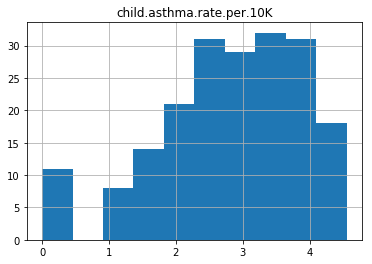

In [8]:
df_y_log.hist()

### Here on down is the Random Forest. First we split into training and testing samples. 

### Then split into a validation sample to use when determining the maximum depth of the tree. 

In [9]:
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y_log, test_size = 0.33, random_state = 2)
x_valid, x_valid_test, y_valid, y_valid_test = train_test_split(x_train, y_train, test_size = 0.33, random_state = 2)

In [10]:
out_sample_score = 0
for i in range(2, 15):
    regr = RandomForestRegressor(max_depth=i, random_state=0,
                      n_estimators=100)
    regr.fit(x_valid, y_valid)
    print(regr.score(x_valid_test, y_valid_test))
    if regr.score(x_valid_test, y_valid_test) > out_sample_score:
        out_sample_score = regr.score(x_valid_test, y_valid_test)
        optimal_depth = i

print("Optimal Depth: " + str(optimal_depth))
print("Out Sample: " + str(out_sample_score))    

-0.03766854839026457
0.06568304706701555
0.13242786891370617
0.1801851870900152
0.20091519933340007
0.2080176072179993
0.20219166901889574
0.20069984415240807
0.20165466877253435
0.20294637196044185
0.2046028090513632
0.20677744979171245
0.20551395068014067
Optimal Depth: 7
Out Sample: 0.2080176072179993


In [11]:
regr = RandomForestRegressor(max_depth=optimal_depth, random_state=0, n_estimators=100)
regr.fit(x_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=7,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
           oob_score=False, random_state=0, verbose=0, warm_start=False)

In [12]:
importances = regr.feature_importances_
indices = np.argsort(importances)[::-1]

In [13]:
indices

array([11, 35, 31, 24,  1,  5,  7, 27, 34,  0,  9,  6, 14,  8, 21, 26, 22,
       28, 19, 30,  3, 16, 29, 20, 10, 33, 18, 15, 25,  4, 23, 13, 32, 12,
        2, 17])

In [14]:
features = {}
for i in indices:
    features[df_x.columns[i]] = regr.feature_importances_[i]

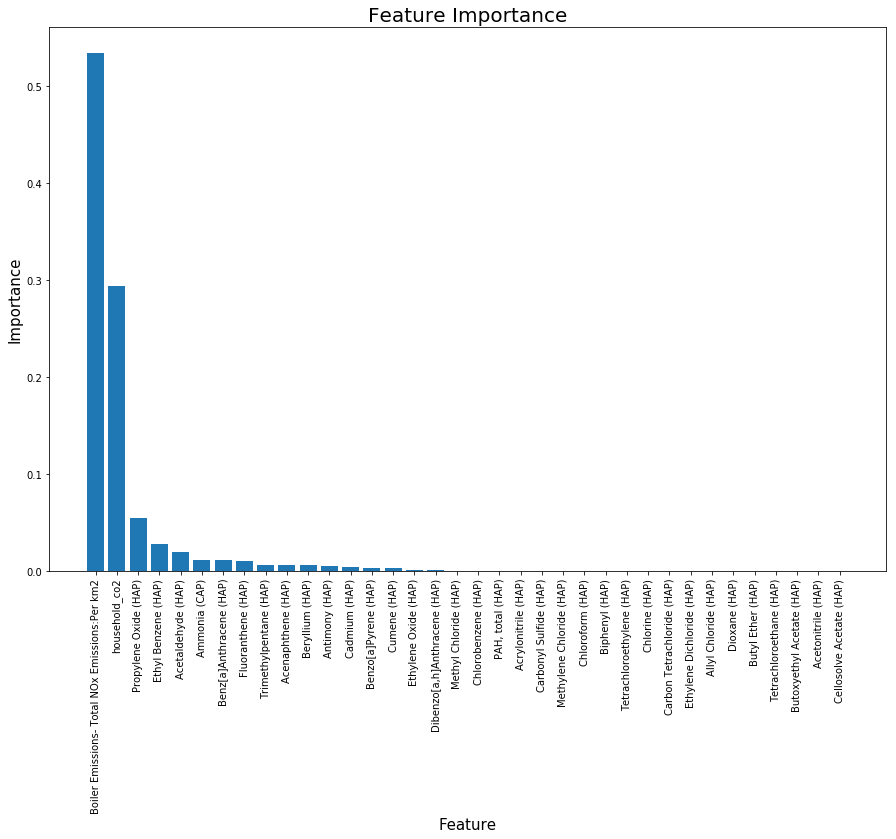

In [15]:
lists = sorted(features.items(), key = lambda item: item[1], reverse = True) # sorted by key, return a list of tuples
x, y = zip(*lists) # unpack a list of pairs into two tuples
plt.figure(figsize=(15,10))
plt.bar(x, y)
plt.title('Feature Importance', fontsize = 20)
plt.ylabel("Importance", fontsize = 15)
plt.xlabel("Feature", fontsize = 15)
plt.xticks(rotation = 'vertical')
plt.show()

In [16]:
df_cleaner = df_clean[['ntacode', 'Boiler Emissions- Total NOx Emissions:Per km2', 'household_co2']]
print(df_cleaner.head())
df_cleaner.loc[df_cleaner.ntacode == 'MN01']

  ntacode  Boiler Emissions- Total NOx Emissions:Per km2  household_co2
0    BK09                                           32.0           2.21
1    BK17                                           23.7          72.43
2    BK19                                           23.7          25.62
3    BK21                                           23.7          18.82
4    BK23                                           23.7           7.47


,ntacode,Boiler Emissions- Total NOx Emissions:Per km2,household_co2
89,MN01,115.3,8.37


In [17]:
print("Feature ranking:")

for f in range(df_x.shape[1]):
    #print("Feature: " + str(df_x.columns[indices[f]]) + " Importance: " + str(importances[indices[f]]))
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

Feature ranking:
1. feature 11 (0.533511)
2. feature 35 (0.294081)
3. feature 31 (0.054183)
4. feature 24 (0.027451)
5. feature 1 (0.019536)
6. feature 5 (0.011751)
7. feature 7 (0.011401)
8. feature 27 (0.009805)
9. feature 34 (0.006225)
10. feature 0 (0.006061)
11. feature 9 (0.005737)
12. feature 6 (0.004714)
13. feature 14 (0.004253)
14. feature 8 (0.003535)
15. feature 21 (0.003063)
16. feature 26 (0.000911)
17. feature 22 (0.000665)
18. feature 28 (0.000420)
19. feature 19 (0.000392)
20. feature 30 (0.000385)
21. feature 3 (0.000356)
22. feature 16 (0.000314)
23. feature 29 (0.000281)
24. feature 20 (0.000266)
25. feature 10 (0.000168)
26. feature 33 (0.000158)
27. feature 18 (0.000121)
28. feature 15 (0.000117)
29. feature 25 (0.000114)
30. feature 4 (0.000014)
31. feature 23 (0.000005)
32. feature 13 (0.000002)
33. feature 32 (0.000002)
34. feature 12 (0.000000)
35. feature 2 (0.000000)
36. feature 17 (0.000000)


In [102]:
#visualize tree
estimator = regr.estimators_[5]
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = df_x.columns,
                class_names = df_y_log.columns,
                rounded = True, proportion = False, 
                precision = 2, filled = True)
# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')
